In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.animation import FuncAnimation
import time
import math
import matplotlib.pyplot as plt
from IPython.display import clear_output

# Set a mudafuggin seed
# random.seed(0)

MAX_MISSILES = 15
NUM_BASE_FEATURES = 12
NUM_MISSILE_FEATURES = 9 # This means that our total size will be 12 + 15 * 9 = 147

class Point: 
    def __init__(self, type):
        self.type = type
        self.coordinates = np.array([0, 0])
        self.radius = 0.2

    def create_target(self):
        x = random.uniform(-3.0, 3.0)
        y = random.uniform(-2.0, 2.0)
        self.coordinates = np.array([x, y])
        self.theta = 0
        return self.coordinates, self.theta
    
    def create_defense(self, target):
        x = random.uniform((target.coordinates[0] - self.radius) - 1.5, (target.coordinates[0] + self.radius) + 1.5)
        y = random.uniform((target.coordinates[1] - self.radius) - 1.5, (target.coordinates[1] + self.radius) + 1.5)
        self.coordinates = np.array([x, y])
        return self.coordinates
    
    def create_attack(self, target):
        x_side_left = random.uniform(-9.5, (target.coordinates[0] - self.radius) - 2)
        x_side_right = random.uniform((target.coordinates[0] + self.radius) + 2, 9.5)
        y_below = random.uniform((target.coordinates[1] - self.radius) - 2, -9.5)
        y_above = random.uniform((target.coordinates[1] + self.radius) + 2, 9.5)
        x_inclusive = random.uniform(-9.5, 9.5)
        y_inclusive = random.uniform(-9.5, 9.5)
        y_below_x_inclusive = np.array([x_inclusive, y_below])
        y_above_x_inclusive = np.array([x_inclusive, y_above])
        x_left_y_inclusive = np.array([x_side_left, y_inclusive])
        x_right_y_inclusive = np.array([x_side_right, y_inclusive])

        self.coordinates = random.choice([y_below_x_inclusive, y_above_x_inclusive, x_left_y_inclusive, x_right_y_inclusive])
        
        # Create attack_theta
        self.AT_abs_length = math.hypot(self.coordinates[0] - target.coordinates[0], self.coordinates[1] - target.coordinates[1])
        self.length_adjacent_r = abs(target.coordinates[0] - self.coordinates[0])
        self.attack_theta_rad = math.acos(self.length_adjacent_r / self.AT_abs_length)

        if self.coordinates[0] < target.coordinates[0]:
            if self.coordinates[1] < target.coordinates[1]:
                self.attack_theta_rad = self.attack_theta_rad
            else:
                self.attack_theta_rad = ((2 * math.pi) - self.attack_theta_rad)
            
        else:
            if self.coordinates[1] < target.coordinates[1]:
                self.attack_theta_rad = ((math.pi) - self.attack_theta_rad)
            else:
                self.attack_theta_rad = ((math.pi) + self.attack_theta_rad)

        return self.coordinates, self.attack_theta_rad

class Missile:
    def __init__(self, type):
        self.type = type
        self.coordinates = np.array([0, 0])
        self.radius = 0.2
    
    def fire_attack_missile(self, attack, global_time):
        self.speed = 1
        self.theta = attack.attack_theta_rad
        self.coordinates = attack.coordinates
        self.fired = True
        self.fired_time = global_time # ------------------ ALSO NOT SURE THIS IS USED

        return self.coordinates, self.theta, self.speed, self.fired, self.fired_time
    
    # def fire_attack_missile(self, global_time):
    #     self.fired = True
    #     self.fired_time = global_time
    #     return self.fired, self.fired_time
    
    def fire_defense_missile(self, global_time):
        self.fired = True
        self.fired_time = global_time
        self.initial_position = np.array([self.coordinates[0], self.coordinates[1]])
        return self.fired, self.fired_time
    
    def create_defense_missile(self, defense, global_time, theta):
        self.speed = 1
        self.theta = theta
        self.coordinates = defense.coordinates
        self.fired = False
        self.fired_time = 0 
        self.defense_missile_to_attack_missile = None
        self.start_distance = None
        self.reward_diff = None

class Environment:
    def __init__(self):
        self.global_time = 0
        self.reward = 0
        self.done = False

        self.target = None
        self.defense = None
        self.attack = None
        self.attack_missile = None
        self.armed_defense_missiles = []
        self.fired_defense_missiles = []

        self.attack_missile_to_target = None

    def set_episode(self, global_time):
        self.reward = 0
        self.target = Point('target')
        self.defense = Point('defense')
        self.attack = Point('attack')

        self.target.create_target()
        self.defense.create_defense(self.target)
        self.attack.create_attack(self.target)

        self.attack_missile = Missile('attack')
        self.attack_missile.create_attack_missile(self.attack)
        self.attack_missile.fire_attack_missile(global_time)
        self.attack_missile_to_target = self.distance_attack_to_target(self.attack_missile)

        self.armed_defense_missiles = []
        self.fired_defense_missiles = []

    def retry_episode(self):
        self.reward = 0
        self.global_time = 0
        self.armed_defense_missiles = []
        self.fired_defense_missiles = []

    def calculate_distance(self, point1, point2):
        return math.hypot(point1[0] - point2[0], point1[1] - point2[1])
    
    def distance_attack_to_target(self, attack_missile):
        self.attack_missile_to_target = (self.calculate_distance(attack_missile.coordinates, self.target.coordinates) - (attack_missile.radius + self.target.radius))
        if self.attack_missile_to_target < 0:
            self.reward += -100
        else:
            print("BEFORE REWARD", self.reward)
            print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)
            print("UNO SOBRE DISTANCE ATTACK TO TARGET", 1 / self.attack_missile_to_target)
            print("DOS VECES ESA MIERDA", -2 * (1 / self.attack_missile_to_target))
            print("LA MIERDA QUE ESTAMOS RESTANDO --------------------------------", -2 * (1 / self.attack_missile_to_target))
            self.reward += (-2 * (1 / self.attack_missile_to_target))

        print("AFTER REWARD", self.reward)
        return self.attack_missile_to_target
    
    def indv_distance_defense_to_attack(self, missile, attack_missile):
        missile.defense_missile_to_attack_missile = (self.calculate_distance(missile.coordinates, attack_missile.coordinates) - (missile.radius + attack_missile.radius))
        return missile.defense_missile_to_attack_missile

    def distance_defense_to_attack(self, attack_missile):
        for missile in self.fired_defense_missiles:
            missile.defense_missile_to_attack_missile = (self.calculate_distance(missile.coordinates, attack_missile.coordinates) - (missile.radius + attack_missile.radius))

    def local_create_defense_missile(self, defense, global_time, armed_defense_missiles, theta):
        defense_missile = Missile('defense')
        defense_missile.create_defense_missile(defense, global_time, theta)
        self.armed_defense_missiles.append(defense_missile)
        return defense_missile
    
    def local_fire_defense_missile(self, defense_missile, global_time, fired_defense_missiles, armed_defense_missiles):
        defense_missile.fire_defense_missile(global_time)
        fired_defense_missiles.append(defense_missile)
        armed_defense_missiles.remove(defense_missile)
        return defense_missile

    def update_attack_missile_position(self, attack_missile):
        new_coordx = self.attack.coordinates[0] + self.attack_missile.speed * self.global_time * math.cos(self.attack_missile.theta)
        new_coordy = self.attack.coordinates[1] + self.attack_missile.speed * self.global_time * math.sin(self.attack_missile.theta)
        attack_missile.coordinates = np.array([new_coordx, new_coordy])
        self.attack_missile.coordinates = np.array([new_coordx, new_coordy])
    
    def update_defense_missile_positions(self):
        for missile in self.fired_defense_missiles:
            new_coordx = missile.initial_position[0] + missile.speed * (self.global_time - missile.fired_time) * math.cos(missile.theta)
            new_coordy = missile.initial_position[1] + missile.speed * (self.global_time - missile.fired_time) * math.sin(missile.theta)
            missile.coordinates = np.array([new_coordx, new_coordy])

    def distance_reward(self):
        print("REWARD ENTRANDO A DISTANCE REWARD", self.reward)
        if len(self.fired_defense_missiles) > 0:
            print("IF ACTIVADO REWARD ENTRANDO A DISTANCE REWARD", self.reward)
            payment_ponderations = [1, 0.9, 0.85, 0.75, 0.65, 0.55, 0.35, 0.25, 0.15, 0.05]
            max_index = len(payment_ponderations) - 1

            for i, missile in enumerate(self.fired_defense_missiles):
                missile.reward_diff = missile.start_distance - missile.defense_missile_to_attack_missile

                if missile.reward_diff > 0:
                    ponderation = payment_ponderations[i] if i <= max_index else 0
                    missile.reward_diff *= ponderation

                print("SUMANDITO EN EL FOR IF ACTIVADO REWARD ENTRANDO A DISTANCE REWARD", self.reward)
                self.reward += missile.reward_diff 
        else:
            print("ELSE ACTIVADO REWARD ENTRANDO A DISTANCE REWARD", self.reward)
            self.reward = self.reward
            print("SELF.REWARD DESPUES DE PUTO", self.reward)

    def check_impact(self):
        for missile in self.fired_defense_missiles:
            if missile.defense_missile_to_attack_missile < 0:
                return 1000, True
            
        if self.attack_missile_to_target < 0:
            return -1000, True

        else:
            return 0, False

    def get_state(self):

        if len(self.fired_defense_missiles) + len(self.armed_defense_missiles) > 15:
            if len(self.fired_defense_missiles) > 15:
                self.fired_defense_missiles = self.fired_defense_missiles[:15]
            if len(self.armed_defense_missiles) + len(self.fired_defense_missiles) > 15:
                self.armed_defense_missiles = self.armed_defense_missiles[:15 - len(self.fired_defense_missiles)]

        base_state = np.array(
            [
                self.global_time,
                self.reward,
                self.target.coordinates[0],
                self.target.coordinates[1],
                self.defense.coordinates[0],
                self.defense.coordinates[1],
                self.attack.coordinates[0],
                self.attack.coordinates[1],
                self.attack_missile.coordinates[0],
                self.attack_missile.coordinates[1],
                self.attack_missile.theta,
                self.attack_missile_to_target
            ]
        )

        for missile in self.fired_defense_missiles:
            fired_missile_state = np.array(
                [
                    missile.fired * 1, # Multiplication to convert boolean to int
                    missile.coordinates[0],
                    missile.coordinates[1],
                    missile.theta,
                    missile.fired_time,
                    self.global_time - missile.fired_time,
                    missile.start_distance,
                    missile.defense_missile_to_attack_missile,
                    missile.reward_diff
                ]
            )

            base_state = np.concatenate((base_state, fired_missile_state))
        
        for missile in self.armed_defense_missiles:
            armed_missile_state = np.array(
                [
                    missile.fired * 1,
                    missile.coordinates[0],
                    missile.coordinates[1],
                    missile.theta,
                    -9999, #fired_time won't make sense (as 0)
                    -9999, #global_time - fired_time won't make sense (as 0)
                    -9999, #start_distance might be needed
                    missile.defense_missile_to_attack_missile, #defense_missile_to_attack_missile might be needed
                    0  #reward as 0 is fine
                ]
            )
        
            base_state = np.concatenate((base_state, armed_missile_state))

        empty_missile = np.array([
            -9999,
            -9999,
            -9999,
            -9999, 
            -9999,
            -9999,
            -9999,
            -9999,
            -9999,
        ])

        # Padding for consistency
        missiles_to_add = MAX_MISSILES - (len(self.fired_defense_missiles) + len(self.armed_defense_missiles))
        if missiles_to_add > 0:
            empty_missiles = np.tile(empty_missile, (missiles_to_add, 1)).flatten()
            base_state = np.concatenate((base_state, empty_missiles))

        return base_state        

    def step(self, action):
        print("-----------------------------------------------\n")
        print("PUTO REWARD ENTRANDO A STEP", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)
        create_missile, fire_now = action
        create_missile_condition, theta = create_missile

        self.update_attack_missile_position(self.attack_missile)
        self.distance_attack_to_target(self.attack_missile)

        print("PUTO TEST 1 REWARD", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)

        if create_missile_condition and (len(self.armed_defense_missiles) + len(self.fired_defense_missiles)) < 15:
            self.local_create_defense_missile(self.defense, self.global_time, self.armed_defense_missiles, theta)
            self.distance_defense_to_attack(self.attack_missile)

        print("PUTO TEST 2 REWARD", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)

        if fire_now:
            self.local_fire_defense_missile(self.armed_defense_missiles[0], self.global_time, self.fired_defense_missiles, self.armed_defense_missiles)
            self.fired_defense_missiles[-1].start_distance = self.indv_distance_defense_to_attack(self.fired_defense_missiles[-1], self.attack_missile)
            
        print("PUTO TEST 3 REWARD", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)

        if len(self.fired_defense_missiles) > 0:
            self.update_defense_missile_positions()
            self.distance_defense_to_attack(self.attack_missile)

        if len(self.armed_defense_missiles) > 0:
            for missile in self.armed_defense_missiles:
                missile.defense_missile_to_attack_missile = self.indv_distance_defense_to_attack(missile, self.attack_missile)

        print("PUTO TEST 5 REWARD", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)

        self.distance_reward()

        print("PUTO TEST 6 REWARD", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)
        print("\n~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
        print("BEFORE TESTING DISTANCE")
        print("Distance Attack to Target:", self.attack_missile_to_target)
        print("Reward:", self.reward)
        print("TESTING DONE", self.done)
        print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
        impact_reward, self.done = self.check_impact()
        self.reward += impact_reward
        print("After Testing Distance")
        print("Distance Attack to Target:", self.attack_missile_to_target)
        print("Reward:", self.reward)
        print("TESTING DONE", self.done)
        print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n")
        print("PUTO TEST 7 REWARD", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)

        self.global_time += 0.2

        print("PUTO TEST 8 REWARD", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)

        state = self.get_state()
        print("PUTO REWARD SALIENDO DE STEP", self.reward)
        print("DISTANCE ATTACK TO TARGET", self.attack_missile_to_target)

        print("###################################################################")
        print("SE ACABÓ ESTA MIERDA")
        print("###################################################################\n")

        return self.reward, self.done, state
    
    def debugger(self, episode_log, episodes):
        for i, episode in enumerate(episodes):
            self.set_episode(0)
            self.global_time = episode_log[episode][f'Step 1'][0][0]
            self.reward = episode_log[episode][f'Step 1'][0][1]
            self.target.coordinates = episode_log[episode][f'Step 1'][0][2:4]
            self.defense.coordinates = episode_log[episode][f'Step 1'][0][4:6]
            self.attack.coordinates = episode_log[episode][f'Step 1'][0][6:8]
            self.attack_missile.coordinates = episode_log[episode][f'Step 1'][0][8:10]
            self.attack_missile.theta = episode_log[episode][f'Step 1'][0][10]
            self.attack_missile_to_target = episode_log[episode][f'Step 1'][0][11]

            print("\n--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/-")
            print("DEBUGGING EPISODE", episodes[i])
            print("-------------------------------------------------------------------")
            print("INITIAL CONDITIONS")
            print("global_time:", self.global_time)
            print("Starting Attack Coordinates:", episode_log[episode][f'Step 1'][0][6:8], "Checking:", self.attack.coordinates)
            print("Starting Defense Coordinates:", episode_log[episode][f'Step 1'][0][4:6], "Checking:", self.defense.coordinates)
            print("Starting Target Coordinates:",  episode_log[episode][f'Step 1'][0][2:4], "Checking:", self.target.coordinates)
            print("-------------------------------------------------------------------")
            print("ATTACK MISSILE")
            print("Attack Missile Fired:", self.attack_missile.fired)
            print("Attack Missile Coordinates:", self.attack_missile.coordinates)
            print("Attack Missile Theta:", self.attack_missile.theta)
            print("Attack Missile Speed:", self.attack_missile.speed)
            print("Attack Missile Fired Time:", self.attack_missile.fired_time)
            print("Attack Missile to Target:", self.attack_missile_to_target)
            print("-------------------------------------------------------------------")
            print("DEFENSE MISSILES")
            if len(self.armed_defense_missiles) > 0:
                i = 0
                for missile in self.defense_missiles:
                    print("Defense Missile", i)
            else:
                print("No defense missiles created.")
            print("-------------------------------------------------------------------\n")

            print("\n--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/-")
            print("STEPS")
            print("--------------------------------------------------------------------")
            print("STATE BEFORE STEP")
            step_num = 1

            for step in episode_log[episode]:
                print("STEP NUMBER ONE", step_num)
                print("global_time:", episode_log[episode][f'Step {step_num}'][0][0])
                print("Attack Missile Coordinates:", episode_log[episode][f'Step {step_num}'][0][8:10])
                print("Distance Attack to Target:", episode_log[episode][f'Step {step_num}'][0][11])
                print("Reward:", episode_log[episode][f'Step {step_num}'][0][1])
                print("-------------------------------------------------------------------")
                print("DEFENSE MISSILES CREATED")

                missile_count = 0

                for j in range(12, 162, 10):
                    if episode_log[episode][f'Step {step_num}'][0][j] == 1:
                        print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
                        print("Defense Missile Created:", episode_log[episode][f'Step {step_num}'][0][j])
                        print("Defense Missile Fired:", episode_log[episode][f'Step {step_num}'][0][j+1])
                        print("Defense Missile Coordinates:", episode_log[episode][f'Step {step_num}'][0][j+2:j+4])
                        print("Defense Missile Theta:", episode_log[episode][f'Step {step_num}'][0][j+4])
                        print("Defense Missile Fired Time:", episode_log[episode][f'Step {step_num}'][0][j+5])
                        print("Global Time - Fired Time:", episode_log[episode][f'Step {step_num}'][0][j+6])
                        print("Start Distance:", episode_log[episode][f'Step {step_num}'][0][j+7])
                        print("Defense Missile to Attack Missile:", episode_log[episode][f'Step {step_num}'][0][j+8])
                        print("Reward Difference:", episode_log[episode][f'Step {step_num}'][0][j+9])
                        print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
                        print("\n")
                        missile_count += 1
                    else:
                        break
                print("Missile Count", missile_count)
                print("...................................................................")
                print("STATE CHOSEN")
                print("Step = Create a missile:", episode_log[episode][f'Step {step_num}'][1][0][0], "Theta:", episode_log[episode][f'Step {step_num}'][1][0][1], "Fire Now:", episode_log[episode][f'Step {step_num}'][1][1])
                print("-------------------------------------------------------------------")

            step_num += 1


    
    def debugging_get_state(self, steps):
        print("\n--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/-")
        print("Environment created.")
        print("-------------------------------------------------------------------")
        print("INITIAL CONDITIONS")
        self.global_time = steps[0]
        self.reward = steps[1]
        self.target.coordinates = np.array([steps[2], steps[3]])
        self.defense.coordinates = np.array([steps[4], steps[5]])
        self.attack.coordinates = np.array([steps[6], steps[7]])
        self.attack_missile.coordinates = np.array([steps[8], steps[9]])
        self.attack_missile.theta = steps[10]
        self.attack_missile_to_target = steps[11]
        print("global_time:", self.global_time)
        print("Reward:", self.reward)
        print("Target coordinates:", self.target.coordinates)
        print("Defense coordinates:", self.defense.coordinates)
        print("Attack coordinates:", self.attack.coordinates)
        print("-------------------------------------------------------------------")
        print("ATTACK MISSILE")
        print("Attack Missile Fired:", self.attack_missile.fired)
        print("Attack Missile Coordinates:", self.attack_missile.coordinates)
        print("Attack Missile Theta:", self.attack_missile.theta)
        print("Attack Missile Speed:", self.attack_missile.speed)
        print("Attack Missile Fired Time:", self.attack_missile.fired_time)
        print("Attack Missile to Target:", self.attack_missile_to_target)
        print("-------------------------------------------------------------------")
        print("DEFENSE MISSILES")
        if len(self.armed_defense_missiles) > 0:
            i = 0
            for missile in self.defense_missiles:
                print("Defense Missile", i)
        else:
            print("No defense missiles created.")
        print("-------------------------------------------------------------------")
        print("\n")
        # print("--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/-\n")
        
        step_num = 1
        for step in steps[12:]:
            print("PRINTING STEP", step)
            print("\n--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/-")
            print("STEP", step_num)
            print("Before: Environment recieved to make step")
            print("global_time:", self.global_time)
            print("Attack Missile Coordinates:", self.attack_missile.coordinates)
            print("Reward:", self.reward)
            print("-------------------------------------------------------------------")
            print("STEP (step function called)")
            print("PRINTING STEPPPPPPPPPPPP", step)
            self.step(step)
            print(f"Step = Create a missile: {step[0][0]}, theta: {step[0][1]}, fire_now: {step[1]}")
            print("-------------------------------------------------------------------")
            print("AFTER STEP: Environment after step")
            print("global_time:", self.global_time)
            print("Attack Missile Coordinates:", self.attack_missile.coordinates)
            print("Reward:", self.reward)
            print("-------------------------------------------------------------------")
            print("DEFENSE MISSILES")
            print("...................................................................")
            print("ARMED MISSILES")
            print("Armed Defense Missiles Count:", len(self.armed_defense_missiles))
            print("Armed Defense Missiles:", self.armed_defense_missiles)

            j = 1 
            for missile in self.armed_defense_missiles:
                print("\n#################")
                print("(ARMED) Defense Missile", j)
                print("Defense Missile Corrdinates:", missile.coordinates)
                print("Defense Missile Theta:", missile.theta)
                print("Defense Missile Fired:", missile.fired)
                print("Defense Missile Fired Time:", missile.fired_time)
                print("Global Time:", self.global_time)
                print("Fired Time:", missile.fired_time)
                print("Global Time - Fired Time:", self.global_time - missile.fired_time)
                print("Defense Missile to Attack Missile:", missile.defense_missile_to_attack_missile)
                print("Defense Missile Start Distance:", missile.start_distance)
                print("Reward Difference:", missile.reward_diff)
                print("#################\n")

                j += 1

            i = 1
            for missile in self.fired_defense_missiles:
                print("\n~~~~~~~~~~~~~~~~~")
                print("(FIRED) Defense Missile", i)
                print("Defense Missile Corrdinates:", missile.coordinates)
                print("Defense Missile Theta:", missile.theta)
                print("Defense Missile Fired:", missile.fired)
                print("Defense Missile Fired Time:", missile.fired_time)
                print("Global Time:", self.global_time)
                print("Fired Time:", missile.fired_time)
                print("Global Time - Fired Time:", self.global_time - missile.fired_time)
                print("Defense Missile to Attack Missile:", missile.defense_missile_to_attack_missile)
                print("Defense Missile Start Distance:", missile.start_distance)
                print("Reward Difference:", missile.reward_diff)
                i += 1
                print("~~~~~~~~~~~~~~~~~\n")

            print("-------------------------------------------------------------------")
            print("IMPACT CHECK & SUMMARY")
            print("Attack Coordinates:", self.attack.coordinates)
            print("Target Coordinates:", self.target.coordinates)
            print("Defense Coordinates:", self.defense.coordinates)
            print("Attack Missile to Target:", self.attack_missile_to_target)
            print("Reward:", self.reward)
            print("Impact Check:", self.check_impact())
            print("--")
            print("Attack Missile Coordinates:", self.attack_missile.coordinates)
            print("Attack distance to target:", self.attack_missile_to_target)
            print("--")
            i = 1
            for missile in self.armed_defense_missiles:
                print("(ARMED) Defense Missile No.:", i)
                print("Defense Missile Coordinates:", missile.coordinates)
                print("Defense Missile to Attack Missile:", missile.defense_missile_to_attack_missile)
                print("Reward Difference:", missile.reward_diff)
                print("--")
                i += 1
            j = 1
            for missile in self.fired_defense_missiles:
                print("(FIRED) Defense Missile No.:", j)
                print("Defense Missile Coordinates:", missile.coordinates)
                print("Defense Missile to Attack Missile:", missile.defense_missile_to_attack_missile)
                print("Reward Difference:", missile.reward_diff)
                print("--")
                j += 1

            print("--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/-\n")
            step_num += 1

env = Environment()
env.set_episode(env.global_time)
episode_log_40 = [0, 0, -2.11921331, -0.09009605, -2.5696576 ,  0.52320294, 6.30434939, -4.33628406, 6.30434939, -4.33628406, 2.674682727511256, 9.033266736517085, ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((1, 4.650430385252665), 0), ((0, None), 0), ((0, None), 0), ((1, 2.5852678368484643), 1), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((1, 0.7380089923519179), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, 3.4012041637830333), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 1), ((1, 0.8335441413304245), 0), ((0, None), 0), ((0, None), 0), ((0, None), 1), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, 2.8120296879579616), 1), ((0, 4.2802514399608), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, 0.28962323688846525), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((1, 5.0047246318913725), 0)]
# env.debugging_get_state(episode_log_40)
episode_log_43 = [0, 0, 0.89574207, 0.06597407, 2.21195397, 0.11899119, -4.54640184, -3.73770072, -4.54640184, -3.73770072, 0.6100071298060873, 6.239643992451294, ((1, 5.960624039134693), 0), ((1, 5.336785709878852), 1), ((0, None), 1), ((0, None), 0), ((0, None), 0), ((1, 5.653841736633629), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 1), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((1, 5.275029689923002), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, 5.943697220762181), 1), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, None), 0), ((0, 2.9610749583471843), 0)]
# env.debugging_get_state(episode_log_43)
episode_log_12 = [0, 0, 0.94947278, -0.31937578, 1.57696927, -0.20987054, 5.02549883, -1.16705021, 5.02549883, -1.16705021, 2.936549438959945, 3.7632367556920108, ((1, 1.9432087642616636), 0), ((0, 6.068116844378332), 1), ((1, 5.888528969840084), 0), ((0, 1.9972480812658626), 1), ((1, 1.5122468355535792), 0), ((1, 0.13251003529953215), 0), ((1, 4.274601025949158), 0), ((0, 5.104041776093964), 0), ((0, None), 0), ((0, 4.333552750538882), 0), ((0, None), 0)]
env.debugging_get_state(episode_log_12)

BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 6.547211746780228
UNO SOBRE DISTANCE ATTACK TO TARGET 0.15273677386282453
DOS VECES ESA MIERDA -0.30547354772564905
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.30547354772564905
AFTER REWARD -0.30547354772564905

--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/--/-
Environment created.
-------------------------------------------------------------------
INITIAL CONDITIONS
global_time: 0
Reward: 0
Target coordinates: [ 0.94947278 -0.31937578]
Defense coordinates: [ 1.57696927 -0.20987054]
Attack coordinates: [ 5.02549883 -1.16705021]
-------------------------------------------------------------------
ATTACK MISSILE
Attack Missile Fired: True
Attack Missile Coordinates: [ 5.02549883 -1.16705021]
Attack Missile Theta: 2.936549438959945
Attack Missile Speed: 1
Attack Missile Fired Time: 0
Attack Missile to Target: 3.7632367556920108
-------------------------------------------------------------------
DEFENSE MISS

In [2]:
env = Environment()
env.set_episode(env.global_time)

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

def build_model(input_dim):
    model = Sequential([
        Dense(128, input_shape=(input_dim,), activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(2, activation='linear')  # Output layer: Assuming 2 actions (create missile and fire missile)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# Assuming your state vector length from get_state() method
input_dim = len(env.get_state())
model = build_model(input_dim)

def choose_action(state, model, epsilon):
    if np.random.rand() <= epsilon:
        create_missile = (np.random.randint(2), np.random.uniform(0, 2*np.pi)) if np.random.rand() > 0.5 else (0, None)
        fire_now = np.random.randint(2) if len(env.armed_defense_missiles) > 0 else 0
    else:
        q_values = model.predict(state.reshape(1, -1))
        create_missile = (1, np.random.uniform(0, 2*np.pi)) if q_values[0][0] > 0.5 else (0, None)
        fire_now = 1 if q_values[0][1] > 0.5 and len(env.armed_defense_missiles) > 0 else 0

    return (create_missile, fire_now)    

BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 8.359973288198448
UNO SOBRE DISTANCE ATTACK TO TARGET 0.11961760708155292
DOS VECES ESA MIERDA -0.23923521416310584
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.23923521416310584
AFTER REWARD -0.23923521416310584


-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 4.627476323762073
UNO SOBRE DISTANCE ATTACK TO TARGET 0.21610051138781713
DOS VECES ESA MIERDA -0.43220102277563427
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.43220102277563427
AFTER REWARD -0.43220102277563427
-----------------------------------------------
env.global_time: 0
env.reward: -0.43220102277563427
starting target coordinates: [-2.03870872 -1.86315296]
starting defense coordinates: [-0.500382   -2.47733906]
starting attack coordinates: [-2.17965243  3.16234732]
starting attack missile coordinates: [-2.17965243  3.16234732]
-----------------------------------------------
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
TESTING NOT OVER False
Step Number: 1
Distance Attack to Target: 4.627476323762073
Reward: -0.43220102277563427
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Global_time: 0.00
action:  ((0, None), 0)
---

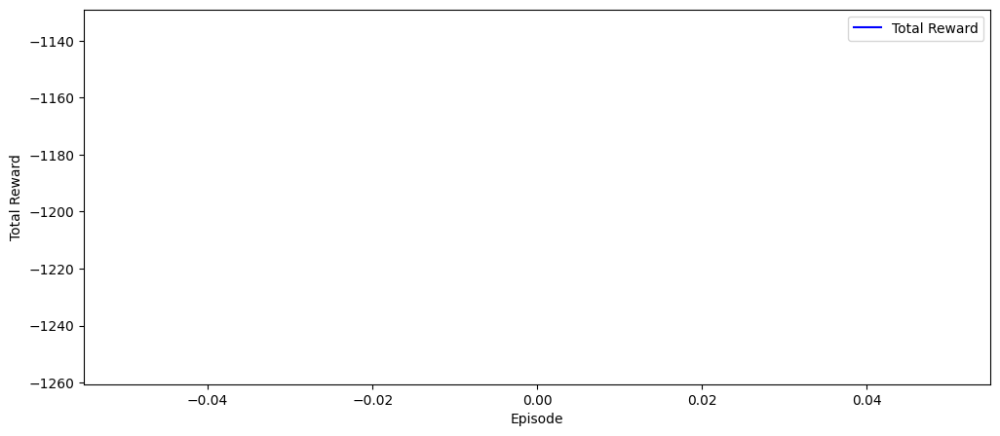

(((((((((((((((((((())))))))))))))))))))
env.global_time: 5.000000000000002
env.reward: -1194.7895763320985
dISTANCE ATTACK TO TARGET: -0.17252367623792822
(((((((((((((((((((())))))))))))))))))))
Episode 1/500, Reward: -1194.7895763320985, Epsilon: 0.9752977125970467
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 13.18972931950207
UNO SOBRE DISTANCE ATTACK TO TARGET 0.07581656725293216
DOS VECES ESA MIERDA -0.15163313450586433
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.15163313450586433
AFTER REWARD -0.15163313450586433
-----------------------------------------------
env.global_time: 0
env.reward: -0.15163313450586433
starting target coordinates: [ 2.4892828  -1.60127055]
starting defense coordinates: [ 1.72147422 -3.0101305 ]
starting attack coordinates: [-6.48914872  8.60012693]
starting attack missile coordinates: [-6.48914872  8.60012693]
-----------------------------------------------
++++++++

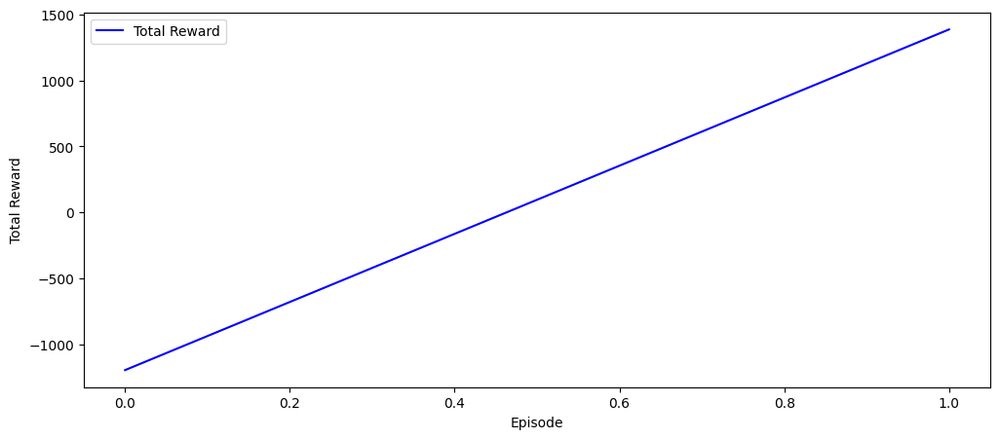

(((((((((((((((((((())))))))))))))))))))
env.global_time: 11.79999999999999
env.reward: 1385.7477046201743
dISTANCE ATTACK TO TARGET: 1.5897293195020819
(((((((((((((((((((())))))))))))))))))))
Episode 2/500, Reward: 1385.7477046201743, Epsilon: 0.9193926150309796
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 9.932450095395932
UNO SOBRE DISTANCE ATTACK TO TARGET 0.10068009306822875
DOS VECES ESA MIERDA -0.2013601861364575
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.2013601861364575
AFTER REWARD -0.2013601861364575
-----------------------------------------------
env.global_time: 0
env.reward: -0.2013601861364575
starting target coordinates: [1.07122635 1.2116726 ]
starting defense coordinates: [-0.53549347  0.7390347 ]
starting attack coordinates: [ 4.91330124 -8.37988543]
starting attack missile coordinates: [ 4.91330124 -8.37988543]
-----------------------------------------------
++++++++++++++++++

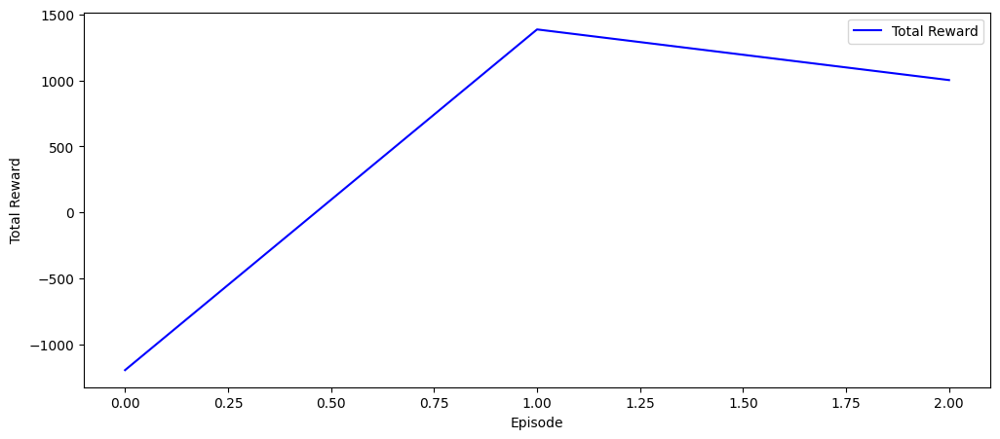

(((((((((((((((((((())))))))))))))))))))
env.global_time: 10.199999999999996
env.reward: 1001.9870514168917
dISTANCE ATTACK TO TARGET: -0.06754990460406429
(((((((((((((((((((())))))))))))))))))))
Episode 3/500, Reward: 1001.9870514168917, Epsilon: 0.8736568985103146
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 7.323684100351962
UNO SOBRE DISTANCE ATTACK TO TARGET 0.1365433006527332
DOS VECES ESA MIERDA -0.2730866013054664
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.2730866013054664
AFTER REWARD -0.2730866013054664
-----------------------------------------------
env.global_time: 0
env.reward: -0.2730866013054664
starting target coordinates: [0.50590581 1.40498543]
starting defense coordinates: [-1.0600909  1.1112214]
starting attack coordinates: [8.015646   3.21028273]
starting attack missile coordinates: [8.015646   3.21028273]
-----------------------------------------------
++++++++++++++++++++++

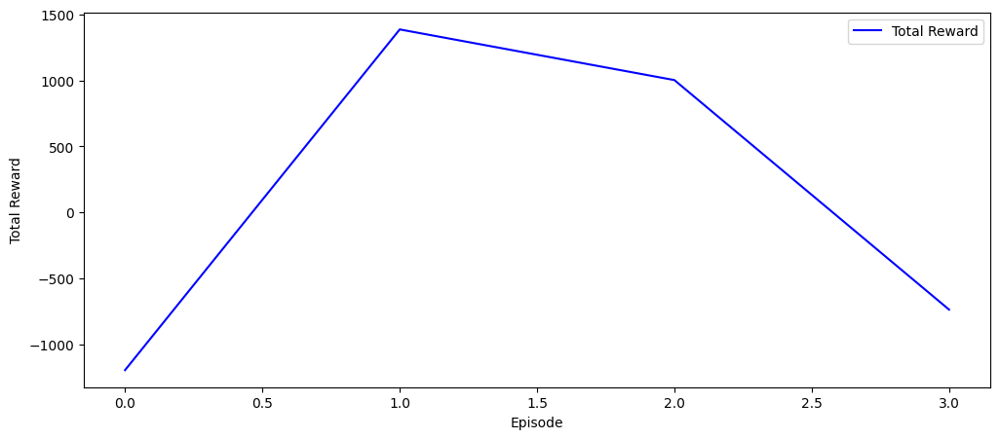

(((((((((((((((((((())))))))))))))))))))
env.global_time: 7.600000000000004
env.reward: -736.5891435366897
dISTANCE ATTACK TO TARGET: -0.07631589964804059
(((((((((((((((((((())))))))))))))))))))
Episode 4/500, Reward: -736.5891435366897, Epsilon: 0.8410648110498392
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 13.209433708003553
UNO SOBRE DISTANCE ATTACK TO TARGET 0.07570347238989536
DOS VECES ESA MIERDA -0.15140694477979072
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.15140694477979072
AFTER REWARD -0.15140694477979072
-----------------------------------------------
env.global_time: 0
env.reward: -0.15140694477979072
starting target coordinates: [-2.45797589 -0.53818619]
starting defense coordinates: [-3.42603417 -1.91461875]
starting attack coordinates: [ 9.43161762 -7.16044049]
starting attack missile coordinates: [ 9.43161762 -7.16044049]
-----------------------------------------------
+++++++++

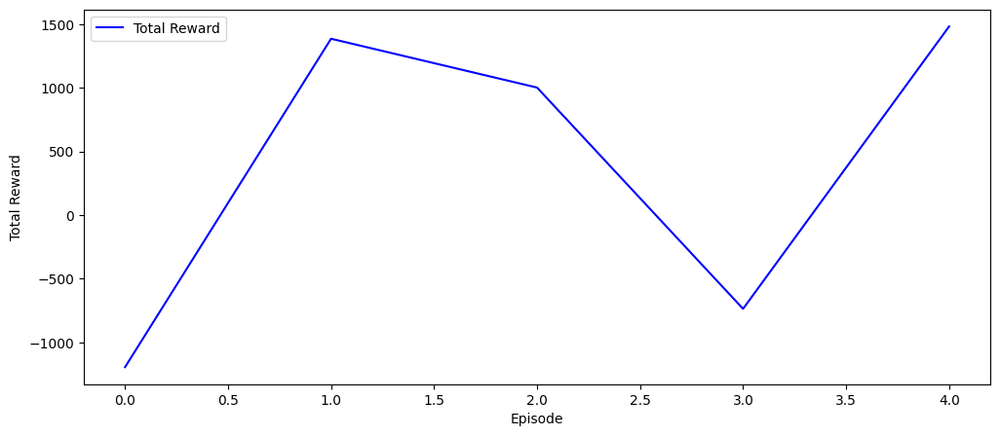

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.2
env.reward: 1481.938503785217
dISTANCE ATTACK TO TARGET: 4.209433708003554
(((((((((((((((((((())))))))))))))))))))
Episode 5/500, Reward: 1481.938503785217, Epsilon: 0.8032337005612527
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 8.814776442864927
UNO SOBRE DISTANCE ATTACK TO TARGET 0.11344587199479626
DOS VECES ESA MIERDA -0.22689174398959253
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.22689174398959253
AFTER REWARD -0.22689174398959253
-----------------------------------------------
env.global_time: 0
env.reward: -0.22689174398959253
starting target coordinates: [-2.77558923 -0.57986313]
starting defense coordinates: [-3.21795859 -2.18319952]
starting attack coordinates: [3.89512761 5.77730933]
starting attack missile coordinates: [3.89512761 5.77730933]
-----------------------------------------------
+++++++++++++++++++++++++++++++++

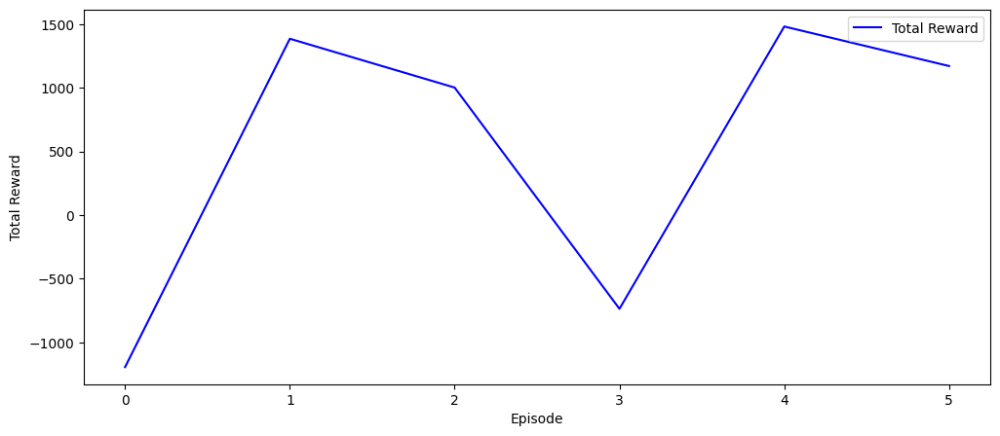

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.0
env.reward: 1171.2063042557106
dISTANCE ATTACK TO TARGET: 0.014776442864925576
(((((((((((((((((((())))))))))))))))))))
Episode 6/500, Reward: 1171.2063042557106, Epsilon: 0.7678721062162944
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 8.936581960731356
UNO SOBRE DISTANCE ATTACK TO TARGET 0.11189960595607423
DOS VECES ESA MIERDA -0.22379921191214847
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.22379921191214847
AFTER REWARD -0.22379921191214847
-----------------------------------------------
env.global_time: 0
env.reward: -0.22379921191214847
starting target coordinates: [-1.2919782   1.62642346]
starting defense coordinates: [-2.88512852  1.05997111]
starting attack coordinates: [ 7.83104228 -0.3590891 ]
starting attack missile coordinates: [ 7.83104228 -0.3590891 ]
-----------------------------------------------
++++++++++++++++++++++++

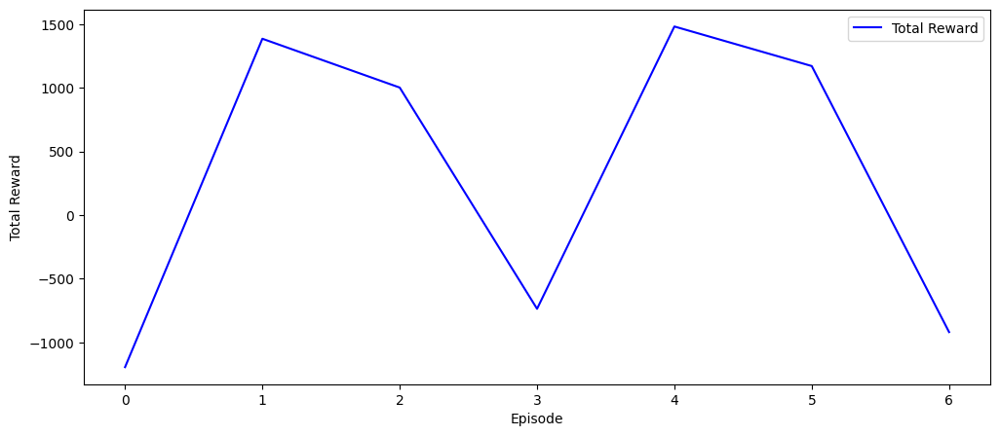

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.2
env.reward: -919.4019443529461
dISTANCE ATTACK TO TARGET: -0.06341803926864342
(((((((((((((((((((())))))))))))))))))))
Episode 7/500, Reward: -919.4019443529461, Epsilon: 0.7333332049215037
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 7.428631329756938
UNO SOBRE DISTANCE ATTACK TO TARGET 0.1346142991366782
DOS VECES ESA MIERDA -0.2692285982733564
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.2692285982733564
AFTER REWARD -0.2692285982733564
-----------------------------------------------
env.global_time: 0
env.reward: -0.2692285982733564
starting target coordinates: [0.05474292 1.19547483]
starting defense coordinates: [1.74703507 1.24191751]
starting attack coordinates: [-7.02555015  4.53567221]
starting attack missile coordinates: [-7.02555015  4.53567221]
-----------------------------------------------
+++++++++++++++++++++++++++++++++

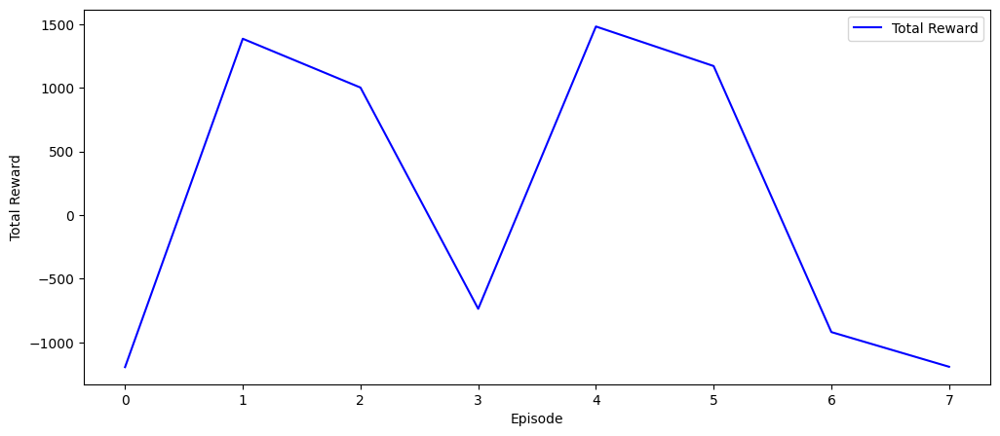

(((((((((((((((((((())))))))))))))))))))
env.global_time: 7.800000000000004
env.reward: -1192.0216182397376
dISTANCE ATTACK TO TARGET: -0.17136867024306504
(((((((((((((((((((())))))))))))))))))))
Episode 8/500, Reward: -1192.0216182397376, Epsilon: 0.7052699677998009
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 14.429931305063294
UNO SOBRE DISTANCE ATTACK TO TARGET 0.06930039920904625
DOS VECES ESA MIERDA -0.1386007984180925
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.1386007984180925
AFTER REWARD -0.1386007984180925
-----------------------------------------------
env.global_time: 0
env.reward: -0.1386007984180925
starting target coordinates: [ 1.61779683 -1.99551639]
starting defense coordinates: [ 2.47493219 -1.38508903]
starting attack coordinates: [-8.19804141  9.12096607]
starting attack missile coordinates: [-8.19804141  9.12096607]
-----------------------------------------------
+++++++++++

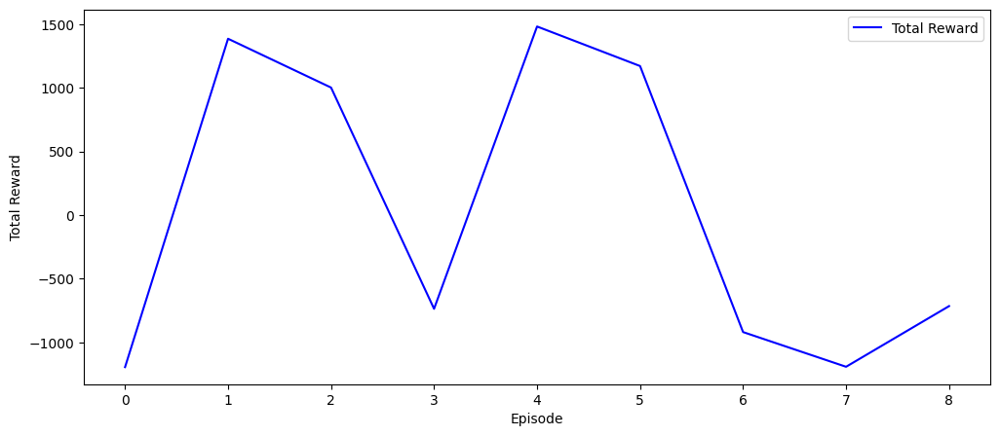

(((((((((((((((((((())))))))))))))))))))
env.global_time: 14.79999999999998
env.reward: -715.3490764736571
dISTANCE ATTACK TO TARGET: -0.170068694936686
(((((((((((((((((((())))))))))))))))))))
Episode 9/500, Reward: -715.3490764736571, Epsilon: 0.654940006215578
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 14.06229408645193
UNO SOBRE DISTANCE ATTACK TO TARGET 0.07111215238795443
DOS VECES ESA MIERDA -0.14222430477590886
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.14222430477590886
AFTER REWARD -0.14222430477590886
-----------------------------------------------
env.global_time: 0
env.reward: -0.14222430477590886
starting target coordinates: [ 0.98095932 -1.81742609]
starting defense coordinates: [ 1.32207658 -0.24964246]
starting attack coordinates: [-8.99723891  8.65126582]
starting attack missile coordinates: [-8.99723891  8.65126582]
-----------------------------------------------
+++++++++++++

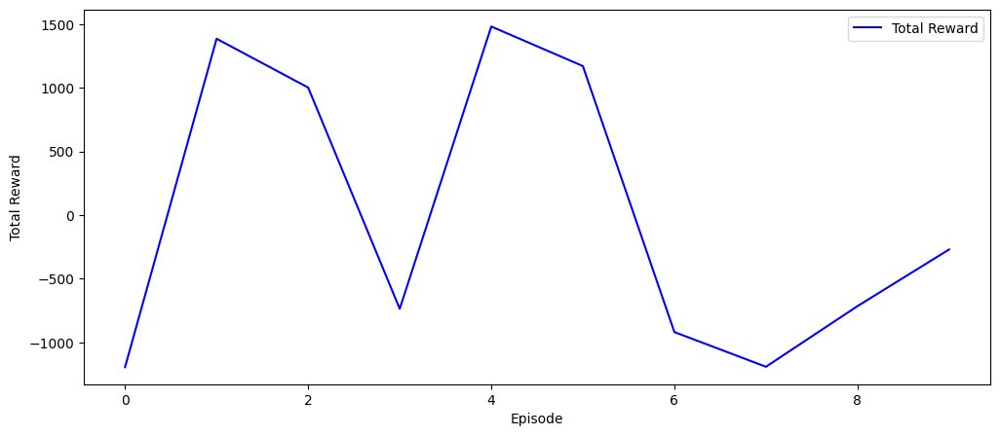

(((((((((((((((((((())))))))))))))))))))
env.global_time: 14.39999999999998
env.reward: -270.5327319734397
dISTANCE ATTACK TO TARGET: -0.13770591354805128
(((((((((((((((((((())))))))))))))))))))
Episode 10/500, Reward: -270.5327319734397, Epsilon: 0.6094199565354498
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 12.508002785148715
UNO SOBRE DISTANCE ATTACK TO TARGET 0.07994881494488813
DOS VECES ESA MIERDA -0.15989762988977627
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.15989762988977627
AFTER REWARD -0.15989762988977627
-----------------------------------------------
env.global_time: 0
env.reward: -0.15989762988977627
starting target coordinates: [1.64429671 0.37878735]
starting defense coordinates: [2.15125636 0.55821178]
starting attack coordinates: [-9.47845613 -6.17109091]
starting attack missile coordinates: [-9.47845613 -6.17109091]
-----------------------------------------------
++++++++++++

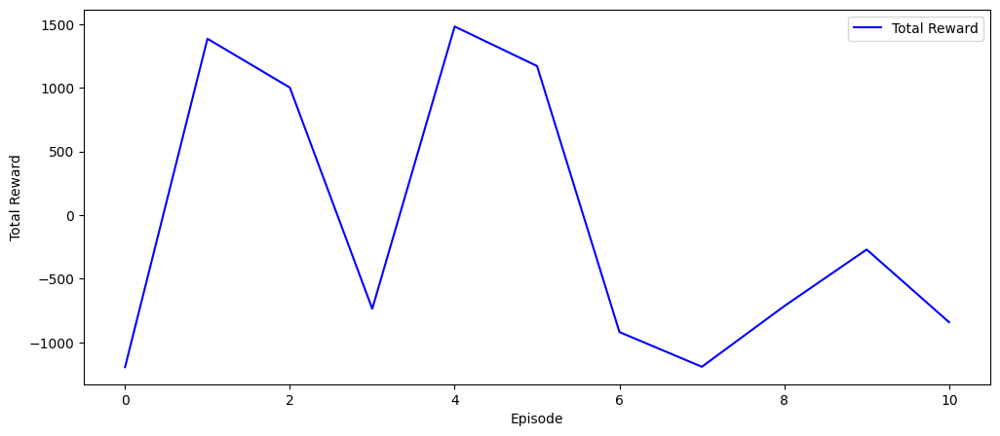

(((((((((((((((((((())))))))))))))))))))
env.global_time: 12.799999999999986
env.reward: -841.8942647138674
dISTANCE ATTACK TO TARGET: -0.09199721485127055
(((((((((((((((((((())))))))))))))))))))
Episode 11/500, Reward: -841.8942647138674, Epsilon: 0.5716206616860866
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 8.895571408775236
UNO SOBRE DISTANCE ATTACK TO TARGET 0.11241548789249531
DOS VECES ESA MIERDA -0.22483097578499062
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.22483097578499062
AFTER REWARD -0.22483097578499062
-----------------------------------------------
env.global_time: 0
env.reward: -0.22483097578499062
starting target coordinates: [-0.59745349 -1.37195333]
starting defense coordinates: [-0.5688582  -2.40064344]
starting attack coordinates: [ 6.54698236 -7.31877469]
starting attack missile coordinates: [ 6.54698236 -7.31877469]
-----------------------------------------------
++++++++

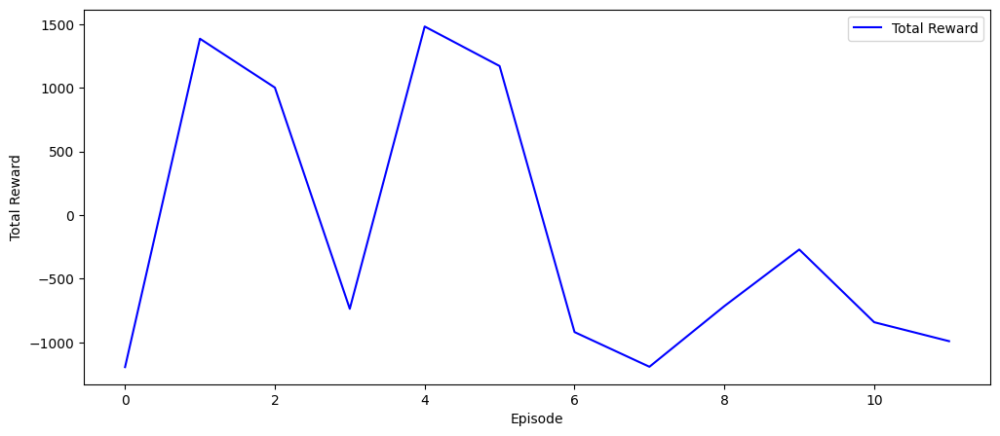

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.2
env.reward: -990.9692553843403
dISTANCE ATTACK TO TARGET: -0.104428591224763
(((((((((((((((((((())))))))))))))))))))
Episode 12/500, Reward: -990.9692553843403, Epsilon: 0.5459091539334175
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 6.983614111882425
UNO SOBRE DISTANCE ATTACK TO TARGET 0.1431923333648301
DOS VECES ESA MIERDA -0.2863846667296602
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.2863846667296602
AFTER REWARD -0.2863846667296602
-----------------------------------------------
env.global_time: 0
env.reward: -0.2863846667296602
starting target coordinates: [-1.58607254  0.66896496]
starting defense coordinates: [-3.20756767  0.30760072]
starting attack coordinates: [ 4.99051679 -2.68755557]
starting attack missile coordinates: [ 4.99051679 -2.68755557]
-----------------------------------------------
++++++++++++++++++++++++++++++

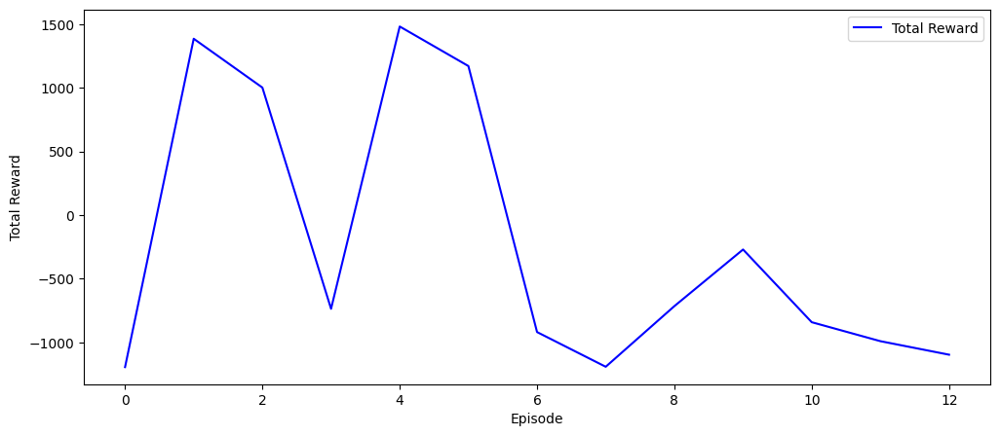

(((((((((((((((((((())))))))))))))))))))
env.global_time: 7.200000000000004
env.reward: -1097.179792863288
dISTANCE ATTACK TO TARGET: -0.016385888117578407
(((((((((((((((((((())))))))))))))))))))
Episode 13/500, Reward: -1097.179792863288, Epsilon: 0.5265964813194676
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 4.462326863439717
UNO SOBRE DISTANCE ATTACK TO TARGET 0.22409833044573638
DOS VECES ESA MIERDA -0.44819666089147275
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.44819666089147275
AFTER REWARD -0.44819666089147275
-----------------------------------------------
env.global_time: 0
env.reward: -0.44819666089147275
starting target coordinates: [-2.55418095 -0.70020811]
starting defense coordinates: [-1.9905948 -0.0546362]
starting attack coordinates: [-5.80330337  2.91717023]
starting attack missile coordinates: [-5.80330337  2.91717023]
-----------------------------------------------
++++++++++

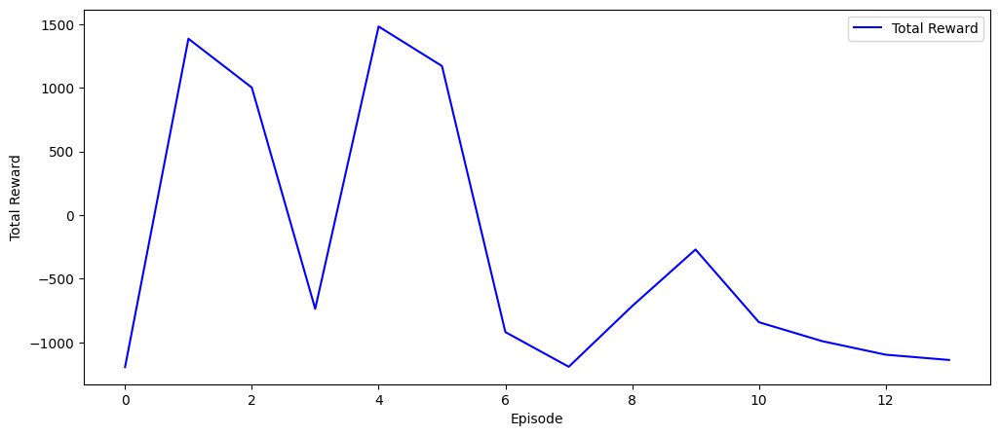

(((((((((((((((((((())))))))))))))))))))
env.global_time: 4.800000000000002
env.reward: -1138.5914772997173
dISTANCE ATTACK TO TARGET: -0.1376731365602839
(((((((((((((((((((())))))))))))))))))))
Episode 14/500, Reward: -1138.5914772997173, Epsilon: 0.5141024461386688
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 5.125226255598383
UNO SOBRE DISTANCE ATTACK TO TARGET 0.1951133374663569
DOS VECES ESA MIERDA -0.3902266749327138
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.3902266749327138
AFTER REWARD -0.3902266749327138
-----------------------------------------------
env.global_time: 0
env.reward: -0.3902266749327138
starting target coordinates: [1.88690772 1.30922714]
starting defense coordinates: [3.36330666 2.47687376]
starting attack coordinates: [-2.60525292 -1.90769965]
starting attack missile coordinates: [-2.60525292 -1.90769965]
-----------------------------------------------
+++++++++++++++++

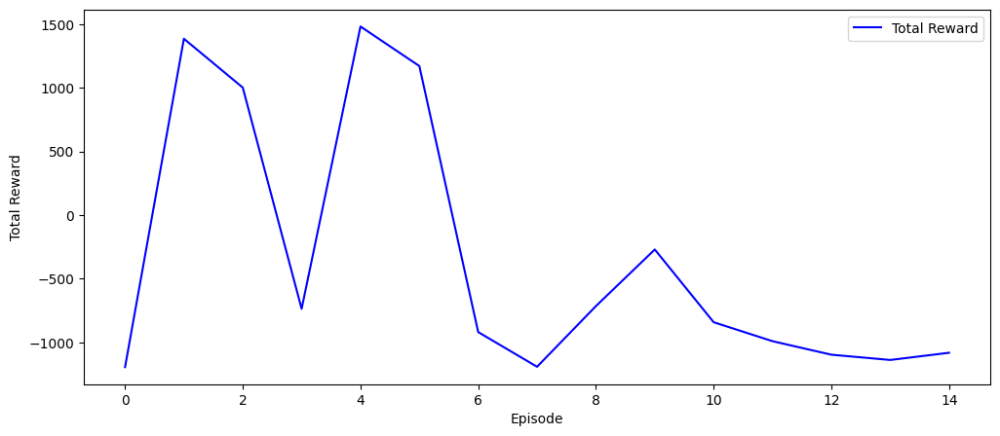

(((((((((((((((((((())))))))))))))))))))
env.global_time: 5.400000000000002
env.reward: -1082.0730125359996
dISTANCE ATTACK TO TARGET: -0.07477374440161849
(((((((((((((((((((())))))))))))))))))))
Episode 15/500, Reward: -1082.0730125359996, Epsilon: 0.5004006352830107
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 10.947539985787467
UNO SOBRE DISTANCE ATTACK TO TARGET 0.09134472231188376
DOS VECES ESA MIERDA -0.18268944462376752
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.18268944462376752
AFTER REWARD -0.18268944462376752
-----------------------------------------------
env.global_time: 0
env.reward: -0.18268944462376752
starting target coordinates: [-0.21267047  0.73950995]
starting defense coordinates: [1.16816202 1.08206507]
starting attack coordinates: [-8.71331257 -6.77752056]
starting attack missile coordinates: [-8.71331257 -6.77752056]
-----------------------------------------------
++++++++

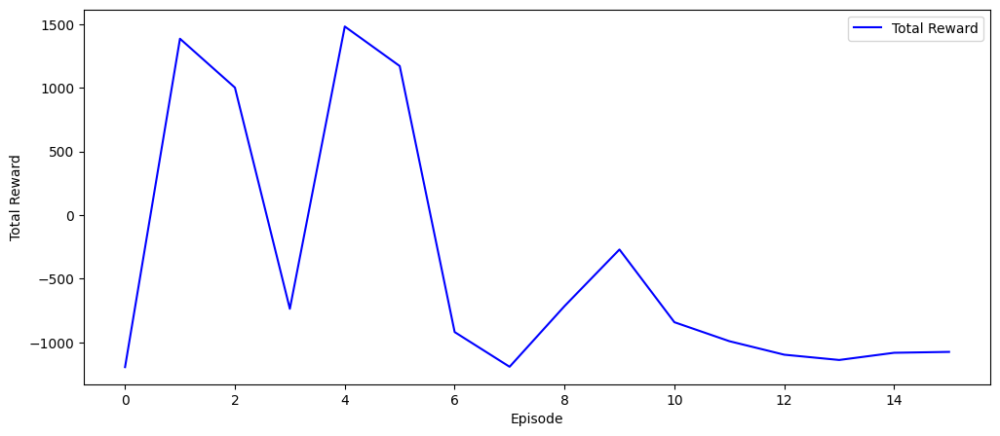

(((((((((((((((((((())))))))))))))))))))
env.global_time: 11.199999999999992
env.reward: -1075.102989450526
dISTANCE ATTACK TO TARGET: -0.05246001421252505
(((((((((((((((((((())))))))))))))))))))
Episode 16/500, Reward: -1075.102989450526, Epsilon: 0.4731351274767304
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 8.868468394070925
UNO SOBRE DISTANCE ATTACK TO TARGET 0.11275904198616266
DOS VECES ESA MIERDA -0.2255180839723253
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.2255180839723253
AFTER REWARD -0.2255180839723253
-----------------------------------------------
env.global_time: 0
env.reward: -0.2255180839723253
starting target coordinates: [-1.39829841  0.94392581]
starting defense coordinates: [-0.84823868  0.28665545]
starting attack coordinates: [ 2.21116508 -7.59283468]
starting attack missile coordinates: [ 2.21116508 -7.59283468]
-----------------------------------------------
++++++++++++

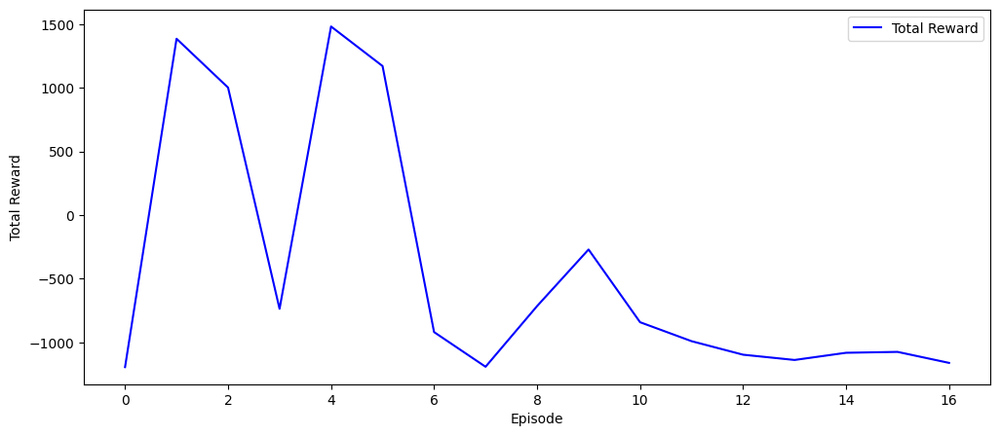

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.2
env.reward: -1161.6004473959888
dISTANCE ATTACK TO TARGET: -0.13153160592907442
(((((((((((((((((((())))))))))))))))))))
Episode 17/500, Reward: -1161.6004473959888, Epsilon: 0.45185350084291465
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 2.771885468342121
UNO SOBRE DISTANCE ATTACK TO TARGET 0.36076526661042213
DOS VECES ESA MIERDA -0.7215305332208443
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.7215305332208443
AFTER REWARD -0.7215305332208443
-----------------------------------------------
env.global_time: 0
env.reward: -0.7215305332208443
starting target coordinates: [-2.97550506 -1.21414293]
starting defense coordinates: [-2.53206055 -1.59624521]
starting attack coordinates: [-5.27855529 -3.39515578]
starting attack missile coordinates: [-5.27855529 -3.39515578]
-----------------------------------------------
++++++++++++++++++++++++

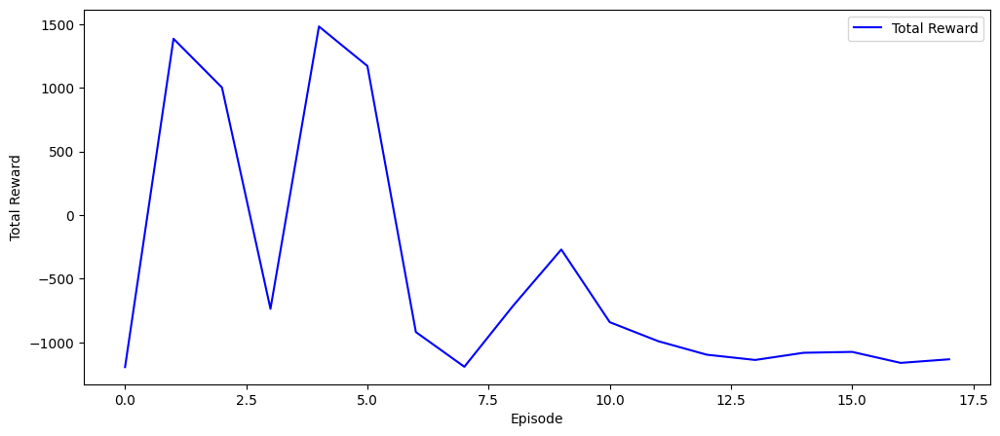

(((((((((((((((((((())))))))))))))))))))
env.global_time: 3.0000000000000004
env.reward: -1133.4197638781416
dISTANCE ATTACK TO TARGET: -0.02811453165787997
(((((((((((((((((((())))))))))))))))))))
Episode 18/500, Reward: -1133.4197638781416, Epsilon: 0.4451229379699419
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 6.360443525269741
UNO SOBRE DISTANCE ATTACK TO TARGET 0.157221740280697
DOS VECES ESA MIERDA -0.314443480561394
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.314443480561394
AFTER REWARD -0.314443480561394
-----------------------------------------------
env.global_time: 0
env.reward: -0.314443480561394
starting target coordinates: [ 2.29807252 -0.57240518]
starting defense coordinates: [0.68348925 0.91168788]
starting attack coordinates: [-2.68820239 -5.13756226]
starting attack missile coordinates: [-2.68820239 -5.13756226]
-----------------------------------------------
++++++++++++++++++

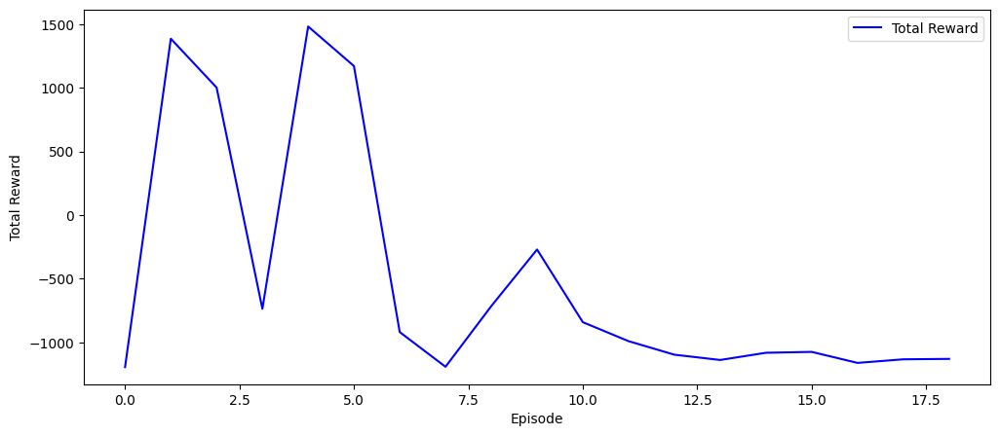

(((((((((((((((((((())))))))))))))))))))
env.global_time: 6.600000000000003
env.reward: -1130.0884372315077
dISTANCE ATTACK TO TARGET: -0.03955647473026186
(((((((((((((((((((())))))))))))))))))))
Episode 19/500, Reward: -1130.0884372315077, Epsilon: 0.43066649544671043
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 9.740803192140595
UNO SOBRE DISTANCE ATTACK TO TARGET 0.10266093876189326
DOS VECES ESA MIERDA -0.20532187752378653
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.20532187752378653
AFTER REWARD -0.20532187752378653
-----------------------------------------------
env.global_time: 0
env.reward: -0.20532187752378653
starting target coordinates: [-1.33193092 -1.41520639]
starting defense coordinates: [-1.07258966 -2.25833534]
starting attack coordinates: [8.11185581 2.27949003]
starting attack missile coordinates: [8.11185581 2.27949003]
-----------------------------------------------
++++++++++

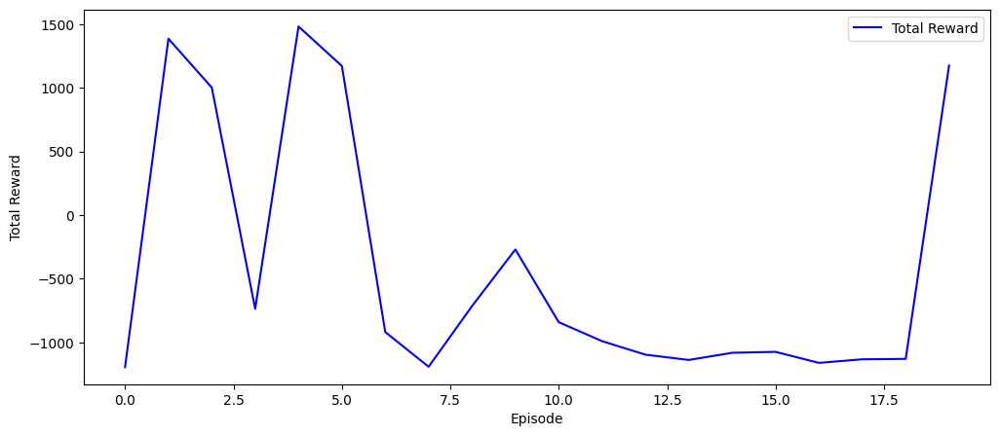

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.2
env.reward: 1174.8721832801368
dISTANCE ATTACK TO TARGET: 0.7408031921405939
(((((((((((((((((((())))))))))))))))))))
Episode 20/500, Reward: 1174.8721832801368, Epsilon: 0.41129510865353336
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 9.84932257301014
UNO SOBRE DISTANCE ATTACK TO TARGET 0.101529825283647
DOS VECES ESA MIERDA -0.203059650567294
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.203059650567294
AFTER REWARD -0.203059650567294
-----------------------------------------------
env.global_time: 0
env.reward: -0.203059650567294
starting target coordinates: [-2.44073866 -0.78610166]
starting defense coordinates: [-2.96178797 -2.31895635]
starting attack coordinates: [6.70212578 3.84602993]
starting attack missile coordinates: [6.70212578 3.84602993]
-----------------------------------------------
+++++++++++++++++++++++++++++++++++++++

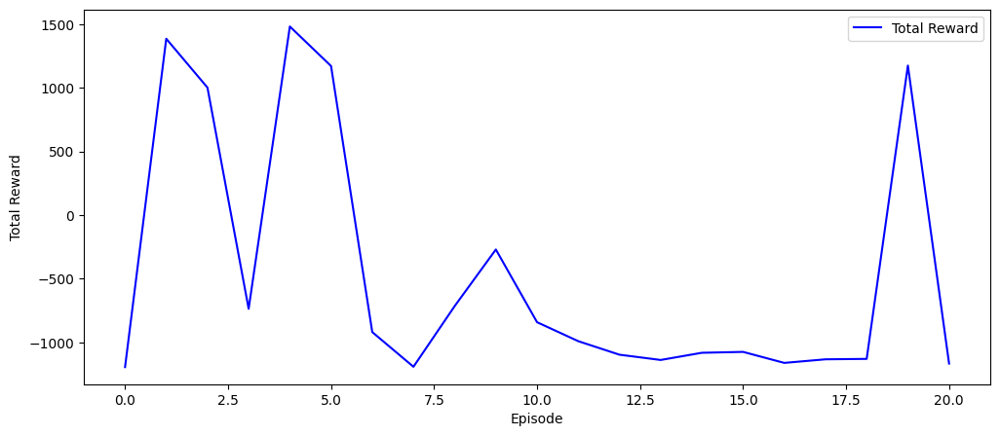

(((((((((((((((((((())))))))))))))))))))
env.global_time: 10.199999999999996
env.reward: -1166.841697107373
dISTANCE ATTACK TO TARGET: -0.15067742698985753
(((((((((((((((((((())))))))))))))))))))
Episode 21/500, Reward: -1166.841697107373, Epsilon: 0.3908349959789493
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 7.391186854555063
UNO SOBRE DISTANCE ATTACK TO TARGET 0.13529626833662267
DOS VECES ESA MIERDA -0.27059253667324534
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.27059253667324534
AFTER REWARD -0.27059253667324534
-----------------------------------------------
env.global_time: 0
env.reward: -0.27059253667324534
starting target coordinates: [-0.82453335  1.14478175]
starting defense coordinates: [-1.11250923 -0.34322438]
starting attack coordinates: [6.42710586 3.99369757]
starting attack missile coordinates: [6.42710586 3.99369757]
-----------------------------------------------
++++++++++++

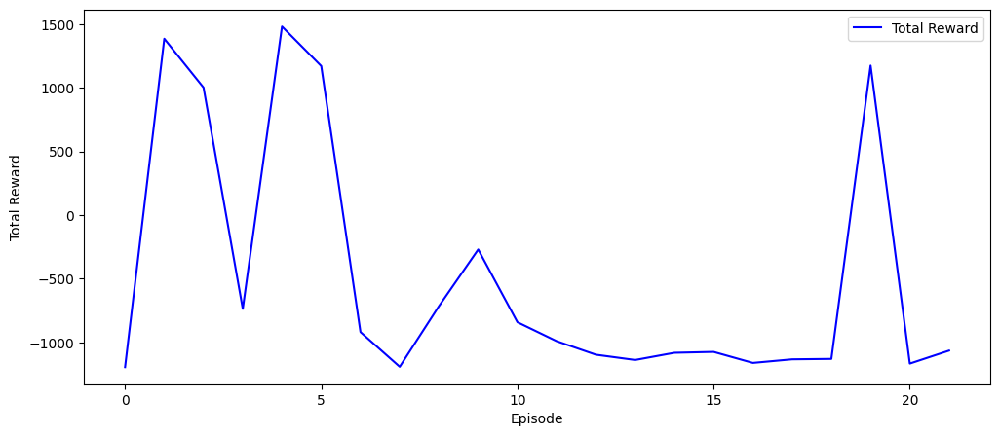

(((((((((((((((((((())))))))))))))))))))
env.global_time: 7.600000000000004
env.reward: -1064.9713549109401
dISTANCE ATTACK TO TARGET: -0.008813145444939885
(((((((((((((((((((())))))))))))))))))))
Episode 22/500, Reward: -1064.9713549109401, Epsilon: 0.37625475470427916
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 9.27993491767537
UNO SOBRE DISTANCE ATTACK TO TARGET 0.10775937642572397
DOS VECES ESA MIERDA -0.21551875285144795
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.21551875285144795
AFTER REWARD -0.21551875285144795
-----------------------------------------------
env.global_time: 0
env.reward: -0.21551875285144795
starting target coordinates: [1.58774583 0.52359826]
starting defense coordinates: [0.05237922 1.95404152]
starting attack coordinates: [-4.58507057  7.97996988]
starting attack missile coordinates: [-4.58507057  7.97996988]
-----------------------------------------------
++++++++++

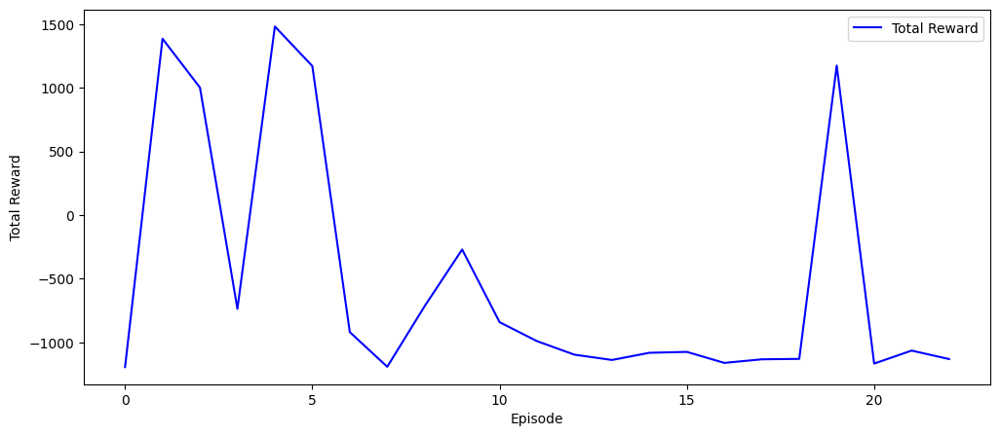

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.599999999999998
env.reward: -1131.4300346888783
dISTANCE ATTACK TO TARGET: -0.12006508232462948
(((((((((((((((((((())))))))))))))))))))
Episode 23/500, Reward: -1131.4300346888783, Epsilon: 0.3586125067115203
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 12.730779771244828
UNO SOBRE DISTANCE ATTACK TO TARGET 0.07854978390708733
DOS VECES ESA MIERDA -0.15709956781417467
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.15709956781417467
AFTER REWARD -0.15709956781417467
-----------------------------------------------
env.global_time: 0
env.reward: -0.15709956781417467
starting target coordinates: [-2.42540296  1.20735911]
starting defense coordinates: [-0.93229722  0.16196376]
starting attack coordinates: [ 7.22799531 -7.69372394]
starting attack missile coordinates: [ 7.22799531 -7.69372394]
-----------------------------------------------
++++++

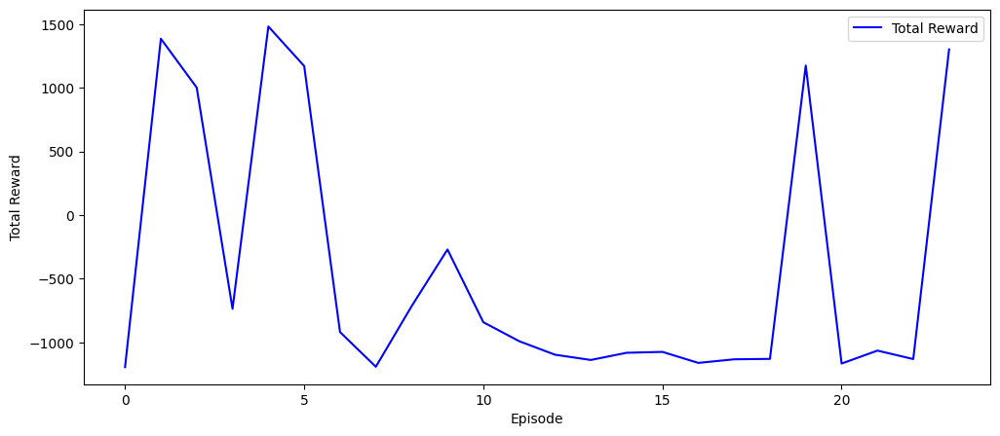

(((((((((((((((((((())))))))))))))))))))
env.global_time: 11.79999999999999
env.reward: 1301.985070259389
dISTANCE ATTACK TO TARGET: 1.1307797712448378
(((((((((((((((((((())))))))))))))))))))
Episode 24/500, Reward: 1301.985070259389, Epsilon: 0.3380564581151032
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 9.317012736308376
UNO SOBRE DISTANCE ATTACK TO TARGET 0.10733053912258834
DOS VECES ESA MIERDA -0.2146610782451767
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.2146610782451767
AFTER REWARD -0.2146610782451767
-----------------------------------------------
env.global_time: 0
env.reward: -0.2146610782451767
starting target coordinates: [ 0.27378246 -0.88944496]
starting defense coordinates: [-1.18003349 -2.4793913 ]
starting attack coordinates: [-8.11974287 -5.78526655]
starting attack missile coordinates: [-8.11974287 -5.78526655]
-----------------------------------------------
+++++++++++++++++

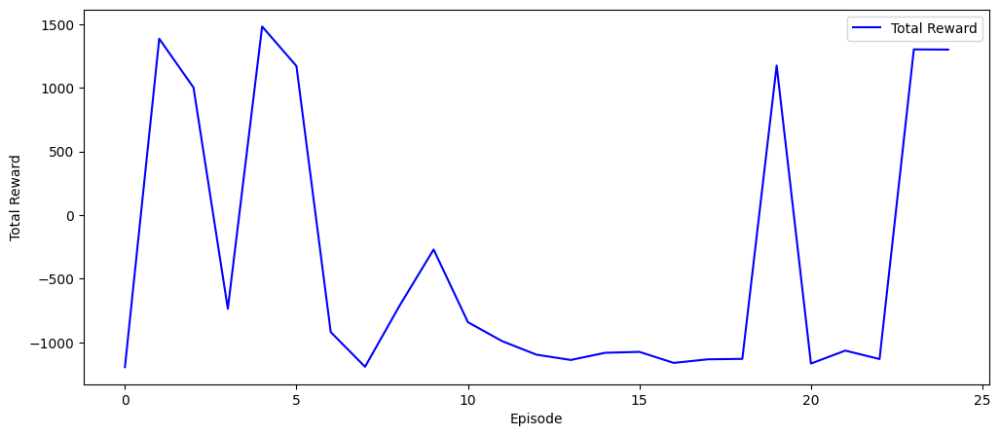

(((((((((((((((((((())))))))))))))))))))
env.global_time: 6.800000000000003
env.reward: 1300.4775283273311
dISTANCE ATTACK TO TARGET: 2.7170127363083716
(((((((((((((((((((())))))))))))))))))))
Episode 25/500, Reward: 1300.4775283273311, Epsilon: 0.32675018086643987
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 5.2935795679302515
UNO SOBRE DISTANCE ATTACK TO TARGET 0.18890808897220226
DOS VECES ESA MIERDA -0.37781617794440453
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.37781617794440453
AFTER REWARD -0.37781617794440453
-----------------------------------------------
env.global_time: 0
env.reward: -0.37781617794440453
starting target coordinates: [2.21930598 0.84802669]
starting defense coordinates: [2.1626571  0.63189889]
starting attack coordinates: [3.43273921 6.41079831]
starting attack missile coordinates: [3.43273921 6.41079831]
-----------------------------------------------
+++++++++++++++++

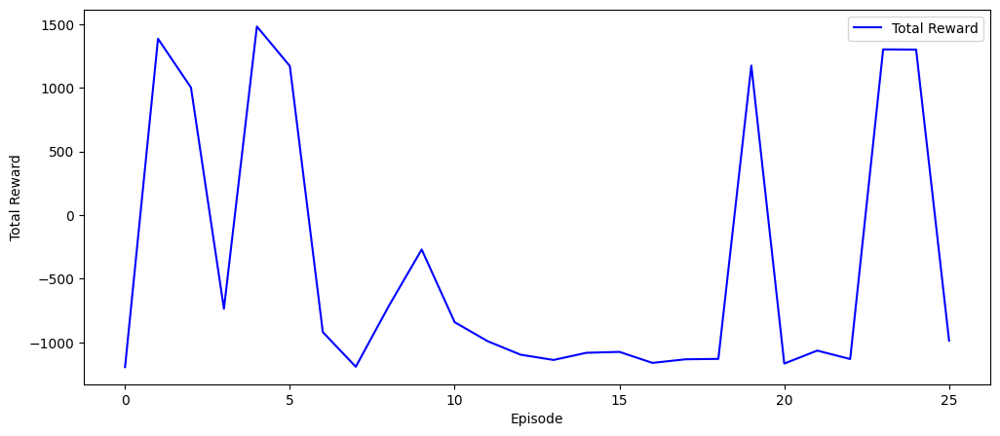

(((((((((((((((((((())))))))))))))))))))
env.global_time: 5.600000000000002
env.reward: -986.5104057035458
dISTANCE ATTACK TO TARGET: -0.10642043206974955
(((((((((((((((((((())))))))))))))))))))
Episode 26/500, Reward: -986.5104057035458, Epsilon: 0.3177236235951741
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 10.28294139812026
UNO SOBRE DISTANCE ATTACK TO TARGET 0.09724843906849473
DOS VECES ESA MIERDA -0.19449687813698946
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.19449687813698946
AFTER REWARD -0.19449687813698946
-----------------------------------------------
env.global_time: 0
env.reward: -0.19449687813698946
starting target coordinates: [-1.77974915  0.36395315]
starting defense coordinates: [-1.02724545 -0.12092975]
starting attack coordinates: [ 7.17700976 -5.45856407]
starting attack missile coordinates: [ 7.17700976 -5.45856407]
-----------------------------------------------
+++++++++

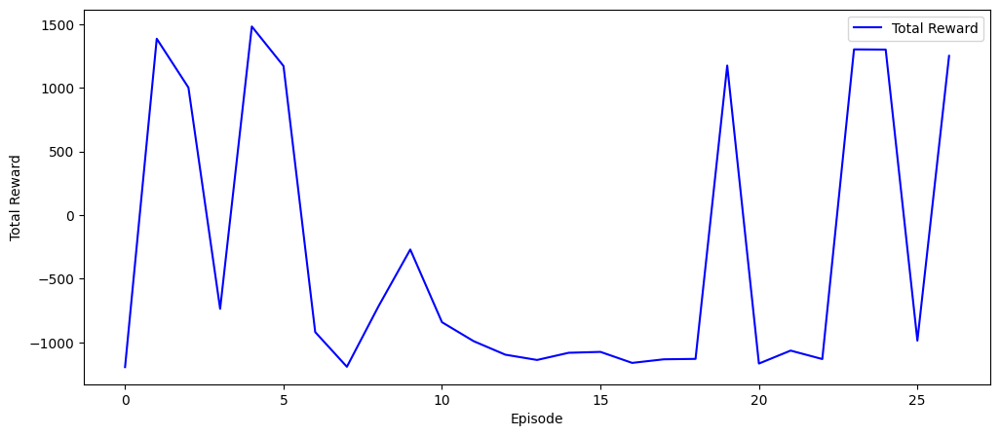

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.599999999999998
env.reward: 1250.861936120854
dISTANCE ATTACK TO TARGET: 0.8829413981202608
(((((((((((((((((((())))))))))))))))))))
Episode 27/500, Reward: 1250.861936120854, Epsilon: 0.30282584784472627
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 8.14687573868
UNO SOBRE DISTANCE ATTACK TO TARGET 0.12274644073091327
DOS VECES ESA MIERDA -0.24549288146182655
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.24549288146182655
AFTER REWARD -0.24549288146182655
-----------------------------------------------
env.global_time: 0
env.reward: -0.24549288146182655
starting target coordinates: [-0.55326421  0.14392286]
starting defense coordinates: [-2.23891627  0.88171497]
starting attack coordinates: [ 7.39997071 -2.98579584]
starting attack missile coordinates: [ 7.39997071 -2.98579584]
-----------------------------------------------
++++++++++++++++

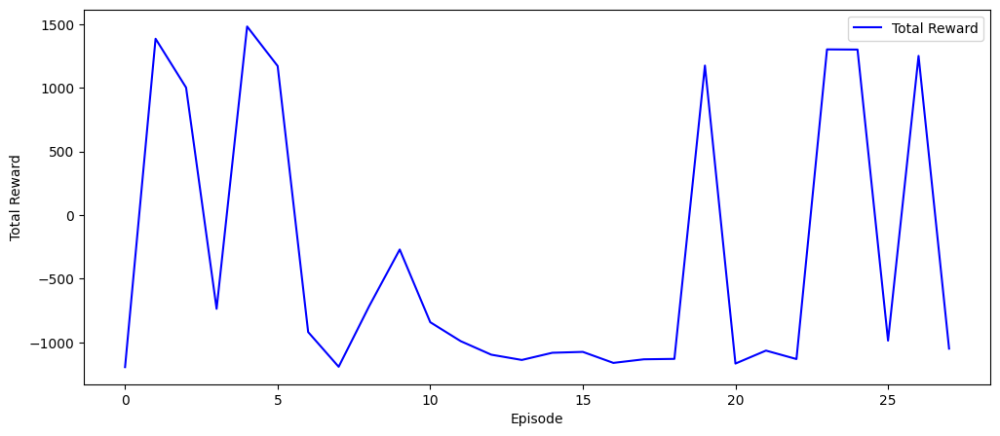

(((((((((((((((((((())))))))))))))))))))
env.global_time: 8.400000000000002
env.reward: -1049.5708392347424
dISTANCE ATTACK TO TARGET: -0.05312426132000153
(((((((((((((((((((())))))))))))))))))))
Episode 28/500, Reward: -1049.5708392347424, Epsilon: 0.2903644524887822
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 7.174955237926346
UNO SOBRE DISTANCE ATTACK TO TARGET 0.13937369179867007
DOS VECES ESA MIERDA -0.27874738359734014
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.27874738359734014
AFTER REWARD -0.27874738359734014
-----------------------------------------------
env.global_time: 0
env.reward: -0.27874738359734014
starting target coordinates: [-1.61471571 -1.7078631 ]
starting defense coordinates: [-1.83561954 -2.94067576]
starting attack coordinates: [5.33764875 1.29955693]
starting attack missile coordinates: [5.33764875 1.29955693]
-----------------------------------------------
+++++++++++

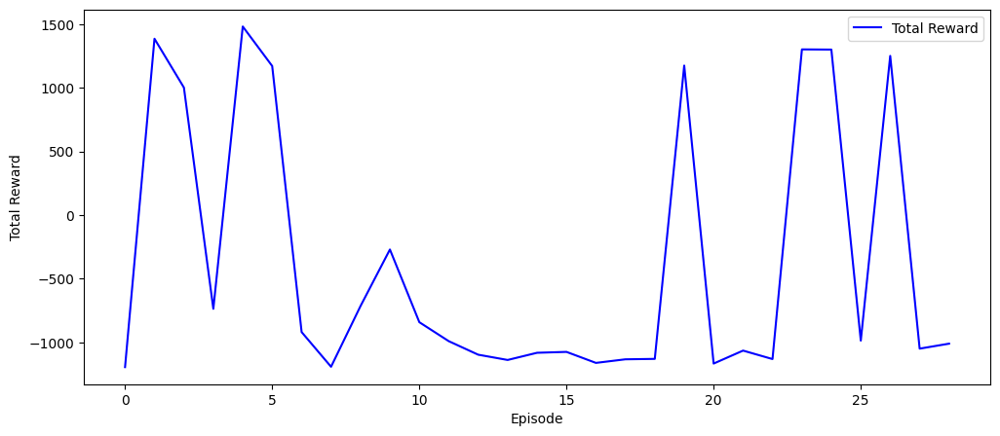

(((((((((((((((((((())))))))))))))))))))
env.global_time: 7.400000000000004
env.reward: -1010.4437037776989
dISTANCE ATTACK TO TARGET: -0.025044762073657523
(((((((((((((((((((())))))))))))))))))))
Episode 29/500, Reward: -1010.4437037776989, Epsilon: 0.2798121133914823
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 5.75893402159059
UNO SOBRE DISTANCE ATTACK TO TARGET 0.1736432465193975
DOS VECES ESA MIERDA -0.347286493038795
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.347286493038795
AFTER REWARD -0.347286493038795
-----------------------------------------------
env.global_time: 0
env.reward: -0.347286493038795
starting target coordinates: [-2.28018409  1.40810861]
starting defense coordinates: [-2.90688851  1.42502572]
starting attack coordinates: [-7.73871437 -1.44441928]
starting attack missile coordinates: [-7.73871437 -1.44441928]
-----------------------------------------------
++++++++++++++++

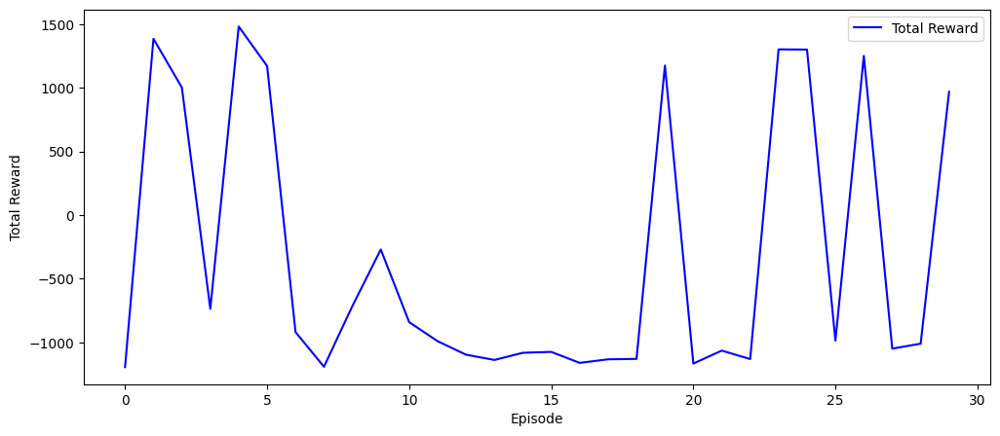

(((((((((((((((((((())))))))))))))))))))
env.global_time: 5.600000000000002
env.reward: 968.9919911198356
dISTANCE ATTACK TO TARGET: 0.3589340215905882
(((((((((((((((((((())))))))))))))))))))
Episode 30/500, Reward: 968.9919911198356, Epsilon: 0.2720822322326576
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 8.663318239571218
UNO SOBRE DISTANCE ATTACK TO TARGET 0.11542921226561036
DOS VECES ESA MIERDA -0.2308584245312207
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.2308584245312207
AFTER REWARD -0.2308584245312207
-----------------------------------------------
env.global_time: 0
env.reward: -0.2308584245312207
starting target coordinates: [-0.35556633 -1.6337571 ]
starting defense coordinates: [-0.31045918 -2.70248321]
starting attack coordinates: [-9.40683017 -1.16646672]
starting attack missile coordinates: [-9.40683017 -1.16646672]
-----------------------------------------------
+++++++++++++++++

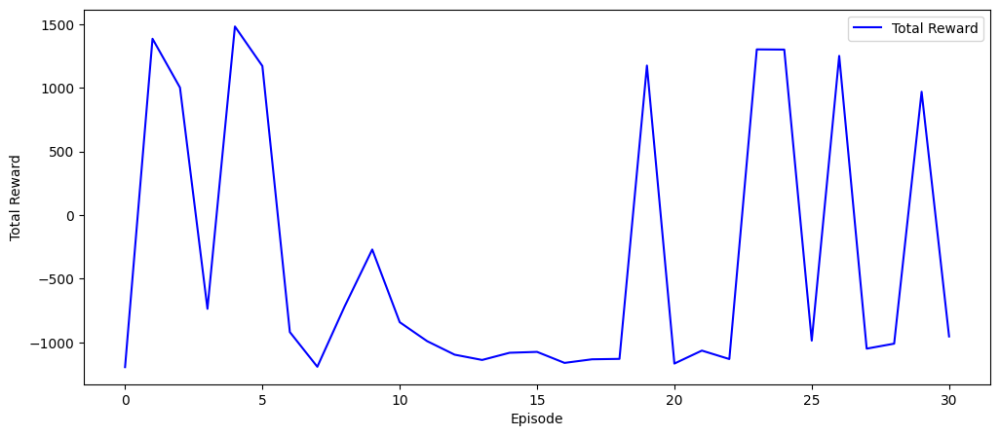

(((((((((((((((((((())))))))))))))))))))
env.global_time: 9.0
env.reward: -953.6692395234825
dISTANCE ATTACK TO TARGET: -0.13668176042878205
(((((((((((((((((((())))))))))))))))))))
Episode 31/500, Reward: -953.6692395234825, Epsilon: 0.2601040725539001
-----------------------------------------------
Starting new episode
BEFORE REWARD 0
DISTANCE ATTACK TO TARGET 8.189472637077767
UNO SOBRE DISTANCE ATTACK TO TARGET 0.12210798476479531
DOS VECES ESA MIERDA -0.24421596952959063
LA MIERDA QUE ESTAMOS RESTANDO -------------------------------- -0.24421596952959063
AFTER REWARD -0.24421596952959063
-----------------------------------------------
env.global_time: 0
env.reward: -0.24421596952959063
starting target coordinates: [ 1.5872422  -1.00237868]
starting defense coordinates: [ 0.35113216 -1.89730298]
starting attack coordinates: [-2.1832121 -8.7200671]
starting attack missile coordinates: [-2.1832121 -8.7200671]
-----------------------------------------------
+++++++++++++++++++++++++++

KeyboardInterrupt: 

In [3]:
episode_logs = {}

def train_model(env, model, episodes, learning_rate=0.01, gamma=0.95, epsilon=1.0, epsilon_decay=0.999, epsilon_min=0.01):
    rewards_list = []

    for episode in range(episodes):
        print("-----------------------------------------------")
        print("Starting new episode")

        env.global_time = 0
        env.done = False
        env.set_episode(env.global_time)
        print("-----------------------------------------------")
        print("env.global_time:", env.global_time)
        print("env.reward:", env.reward)
        print("starting target coordinates:", env.target.coordinates)
        print("starting defense coordinates:", env.defense.coordinates)
        print("starting attack coordinates:", env.attack.coordinates)
        print("starting attack missile coordinates:", env.attack_missile.coordinates)        
        print("-----------------------------------------------")
        state = env.get_state()
        total_reward = 0
        
        starting_env = [env.global_time, env.reward, env.target.coordinates, env.defense.coordinates, env.attack.coordinates, env.attack_missile.coordinates, env.attack_missile.theta, env.attack_missile_to_target]
        actions_list = []
        
        step_num = 1

        while not env.done:

            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("TESTING NOT OVER", env.done)
            print("Step Number:", step_num)
            print("Distance Attack to Target:", env.attack_missile_to_target)
            print("Reward:", env.reward)
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


            print(f"Global_time: {env.global_time:.2f}")
            action = choose_action(state, model, epsilon)  
            print("action: ", action)
            actions_list.append(action)
            env.reward, env.done, next_state = env.step(action)
            print("###################################################################")
            print("SE ACABÓ ESTA MIERDA AHORA EN EL TRAINING")
            print("###################################################################\n")
            print("PUTO ENV.REWARD", env.reward)
            print("Done: ", env.done)
            print("Reward after action: ", env.reward)

            # total_reward += reward
            # print("Total reward: ", total_reward)

            print(f"Attack Missile Coordinates: {env.attack_missile.coordinates}")
            print(f"Reward: {env.reward:.2f}")
            print(f" Distance to Target: {env.attack_missile_to_target:.2f}")
            print(env.fired_defense_missiles)
            print("length of fired defense missiles: ", len(env.fired_defense_missiles))
            print("\n////////////////////////////////////////////////////////////")
            print("////////////////////////////////////////////////////////////")
            print("////////////////////////////////////////////////////////////")
            for missile in env.fired_defense_missiles:
                print(f"Defense Missile {missile.coordinates} Distance to Attack Missile: {missile.defense_missile_to_attack_missile:.2f}")
                print(f"Reward Difference: {missile.reward_diff:.2f}")
            print("////////////////////////////////////////////////////////////")
            print("////////////////////////////////////////////////////////////")
            print("////////////////////////////////////////////////////////////\n")

            # Obtain the next action's max Q-value for the Bellman equation update
            next_q_values = model.predict(next_state.reshape(1, -1))
            max_next_q_value = np.max(next_q_values)  # Assume the model outputs separate Q-values for each action type

            # Get current Q-values, update the relevant action's Q-value
            current_q_values = model.predict(state.reshape(1, -1))
            current_q_values[0][np.argmax(next_q_values[0])] = env.reward + gamma * max_next_q_value

            # Fit the model
            model.fit(state.reshape(1, -1), current_q_values, epochs=1, verbose=0)

            state = next_state  # Update state

            # Decay epsilon
            if epsilon > epsilon_min:
                epsilon *= epsilon_decay

            step_num += 1
            print("\n+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("TESTING NOT OVER", env.done)
            print("Step Number:", step_num)
            print("Distance Attack to Target:", env.attack_missile_to_target)
            print("Reward:", env.reward)
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
            print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++\n")

        print("(((((((((((((((((((())))))))))))))))))))")
        print("Reward after episode: ", env.reward)
        print("(((((((((((((((((((())))))))))))))))))))")

        episode_logs[episode] = starting_env + actions_list
        rewards_list.append(env.reward) 
        
        #Plot some shii
        # clear_output(wait=True)
        plt.figure(figsize=(12, 5))
        plt.plot(rewards_list, color='b', label='Total Reward')
        plt.xlabel('Episode')
        plt.ylabel('Total Reward')
        plt.legend()
        plt.show()

        print("(((((((((((((((((((())))))))))))))))))))")
        print("env.global_time:", env.global_time)
        print("env.reward:", env.reward)
        print("dISTANCE ATTACK TO TARGET:", env.attack_missile_to_target)
        print("(((((((((((((((((((())))))))))))))))))))")
        
        print(f"Episode {episode + 1}/{episodes}, Reward: {env.reward}, Epsilon: {epsilon}")

env = Environment()  # Assume env is your environment instance
train_model(env, model, 500)  # Train for 500 episodes


In [ ]:
# env.debugger(episode_logs, ['Episode 3'])
print(episode_logs[12])

[0, 0, array([ 0.94947278, -0.31937578]), array([ 1.57696927, -0.20987054]), array([ 5.02549883, -1.16705021]), array([ 5.02549883, -1.16705021]), 2.936549438959945, 3.7632367556920108, ((1, 1.9432087642616636), 0), ((0, 6.068116844378332), 1), ((1, 5.888528969840084), 0), ((0, 1.9972480812658626), 1), ((1, 1.5122468355535792), 0), ((1, 0.13251003529953215), 0), ((1, 4.274601025949158), 0), ((0, 5.104041776093964), 0), ((0, None), 0), ((0, 4.333552750538882), 0), ((0, None), 0)]


In [ ]:
 h